#📖 Introduction

The purpose of this project was to apply advanced machine learning techniques to the SWAN dataset in order to predict bone density flag (BMDFLG0) as an indicator of health status. Using Random Forest, we were able to classify individuals based on multiple demographic, medical, and lifestyle features. The workflow included preprocessing, feature engineering, training a Random Forest classifier, evaluating performance with ROC & AUC, and analyzing feature importances.

# SWAN Baseline Health Analysis & Predictive Modeling

This project explores the SWAN Baseline dataset, which contains health-related demographic and clinical variables.  
Our objectives are:
1. **Descriptive Analytics** – Understand health patterns using exploratory data analysis (EDA).  
2. **Predictive Modeling** – Build machine learning models to identify individuals at higher risk of adverse health outcomes.  
3. **Business Insights** – Provide actionable findings that could support PharmaQuant in clinical decision-making, population health monitoring, and drug trial design.  


In [1]:
!pip install seaborn matplotlib scikit-learn

***Data Import***

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    classification_report, confusion_matrix, roc_curve, auc
)

In [8]:
# Set theme
sns.set(style="whitegrid")
plt.rcParams["axes.prop_cycle"] = plt.cycler(color=["#800080", "#9370DB", "#BA55D3", "#D8BFD8"])
plt.rcParams["figure.figsize"] = (8, 5)

***Loading Dataset***

In [7]:
# Load dataset
df = pd.read_csv("SWAN_baseline.csv")

# Preview
print("Shape:", df.shape)
df.head()

Shape: (3302, 741)


/tmp/ipython-input-4019916340.py:2: DtypeWarning: Columns (3,44,62,68,86,137,140,144,148,157,158,165,169,171,175,177,181,183,260,261,262,264,266,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,342,343,344,345,347,348,349,350,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,400,402,404,406,407,408,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,539,540,556,558) have mixed

,SWANID,VISIT,INTDAY0,AGE0,PREGNAN0,PREVBLO0,ALCHL240,EATDRIN0,STRTPER0,BLDRWAT0,...,HPSCDAY0,HPSCTIM0,HPSCMOD0,SPBMDT0,HPBMDT0,BMDFLG0,STATUS0,LMPDAY0,OCCUP0,RACE
0,10005,0,0,48,1,,1,1,2,1,...,,.,,,,,,,458,5
1,10046,0,0,52,1,,1,1,2,1,...,0,0:08:53,5,1.1163,.928,,4,-35,379,2
2,10056,0,0,51,1,1,2,1,2,1,...,75,0:15:17,11,.8954,.8547,,5,-57,,4
3,10092,0,0,45,1,,2,1,2,1,...,0,0:18:13,5,1.0471,.8158,,4,-59,33,4
4,10126,0,0,48,1,,1,1,2,1,...,,.,,,,,4,-49,95,1


***Data Overview & Cleaning***

In [9]:
# Info and missing values
df.info()
print("\nMissing values per column:\n", df.isnull().sum())

# Basic stats
df.describe(include="all").T

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3302 entries, 0 to 3301
Columns: 741 entries, SWANID to RACE
dtypes: float64(10), int64(239), object(492)
memory usage: 18.7+ MB

Missing values per column:
 SWANID      0
VISIT       0
INTDAY0     0
AGE0        0
PREGNAN0    0
           ..
BMDFLG0     0
STATUS0     0
LMPDAY0     0
OCCUP0      0
RACE        0
Length: 741, dtype: int64


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
SWANID,3302.0,NaN,NaN,NaN,54361.658389,25723.741173,10005.0,31808.0,54230.0,76744.5,99992.0
VISIT,3302.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0
INTDAY0,3302.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AGE0,3302,24,44,265,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PREGNAN0,3302.0,NaN,NaN,NaN,0.978801,0.460008,-9.0,1.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...
BMDFLG0,3302,2,,3299,NaN,NaN,NaN,NaN,NaN,NaN,NaN
STATUS0,3302,4,5,1761,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LMPDAY0,3302,151,,118,NaN,NaN,NaN,NaN,NaN,NaN,NaN
OCCUP0,3302,253,,663,NaN,NaN,NaN,NaN,NaN,NaN,NaN


***Exploratory Data Analysis (EDA)***

*1. Distribution of Numerical Variables*

/tmp/ipython-input-3972054672.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


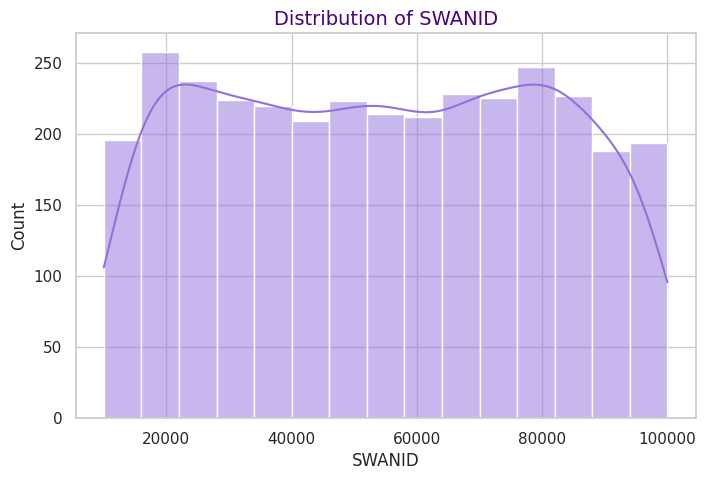

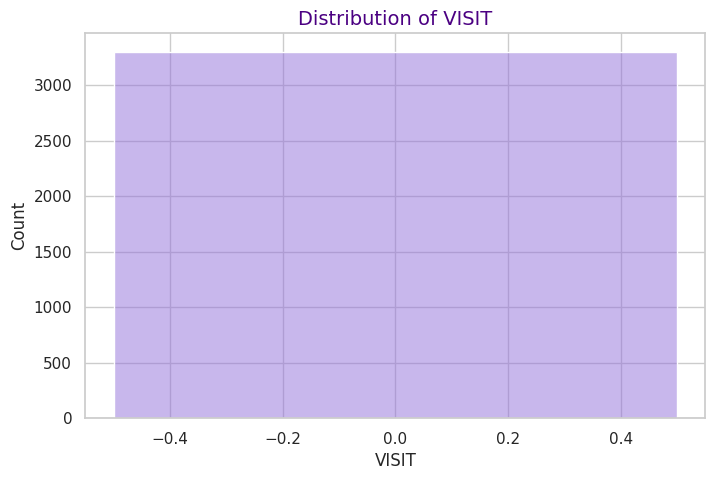

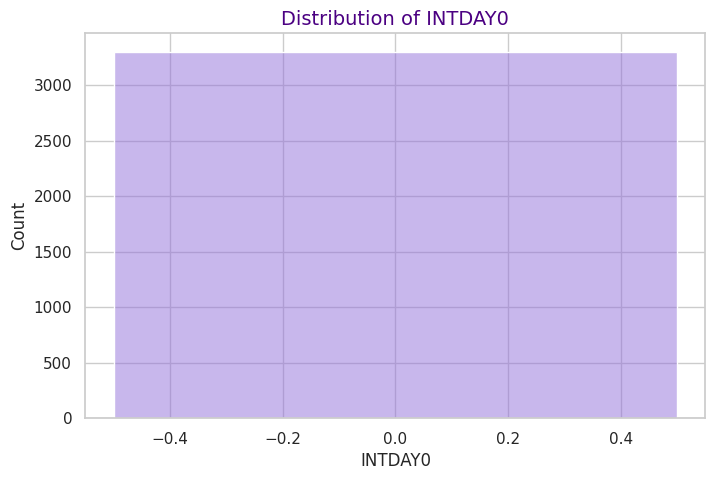

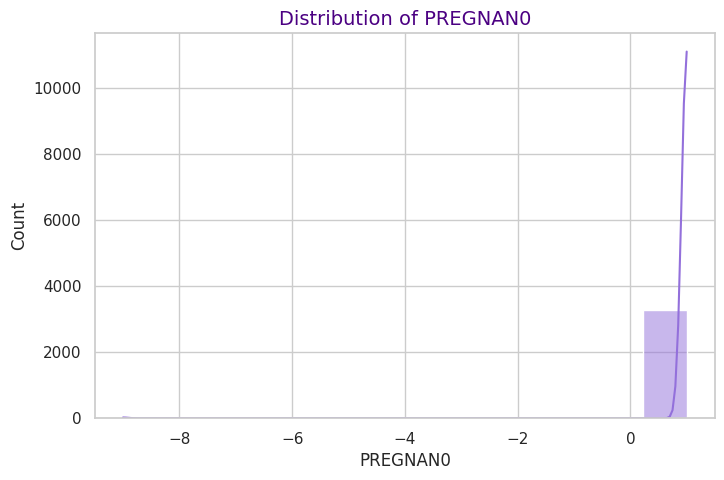

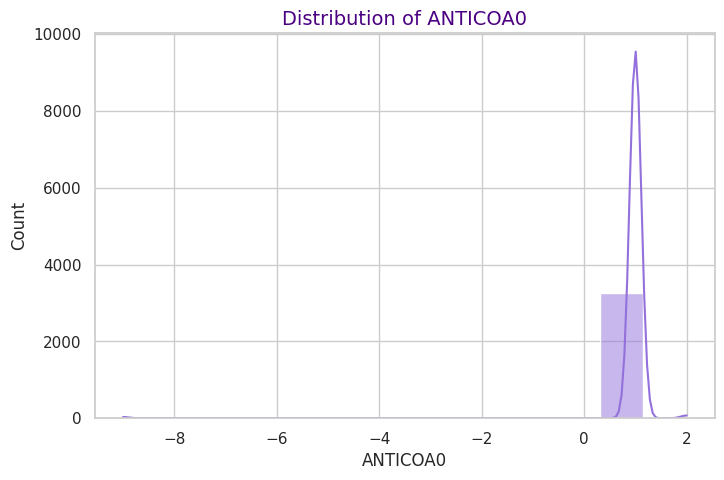

...

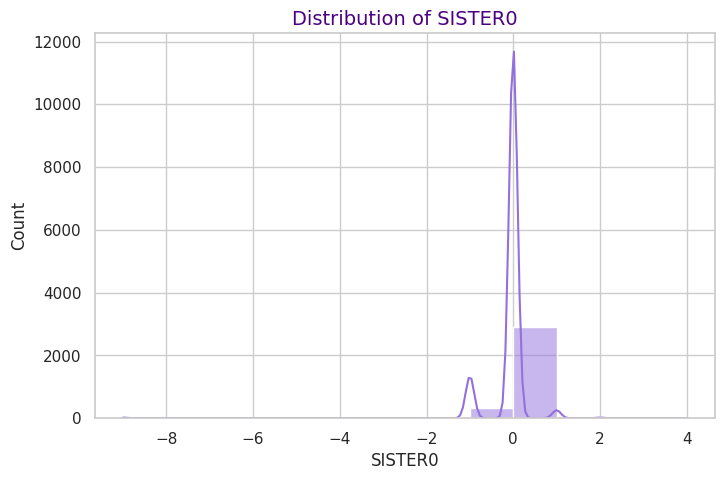

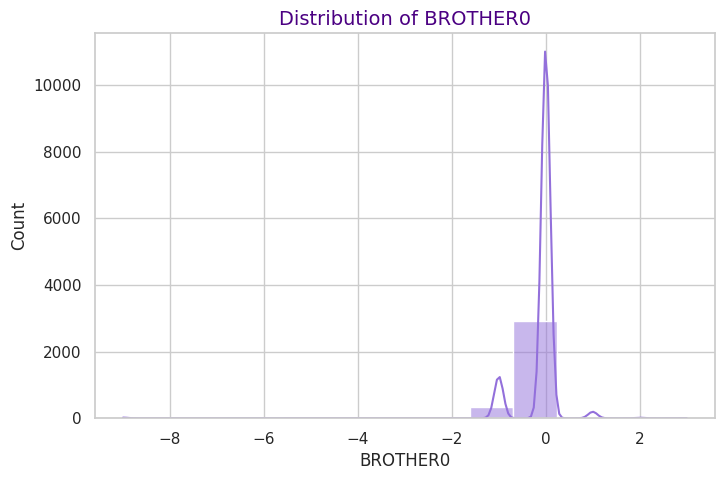

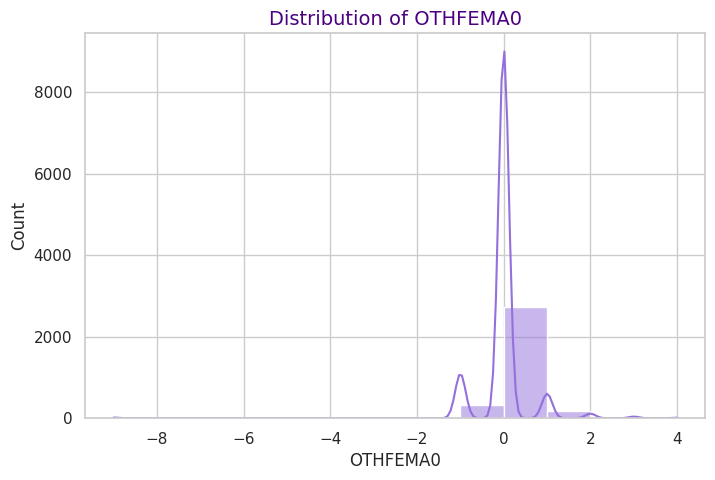

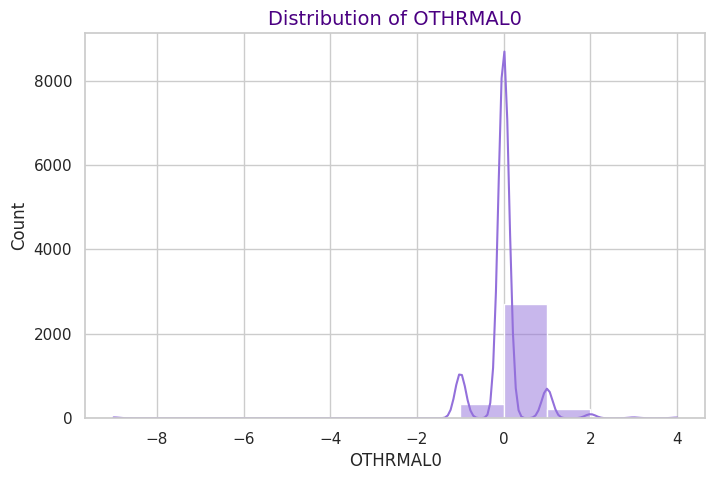

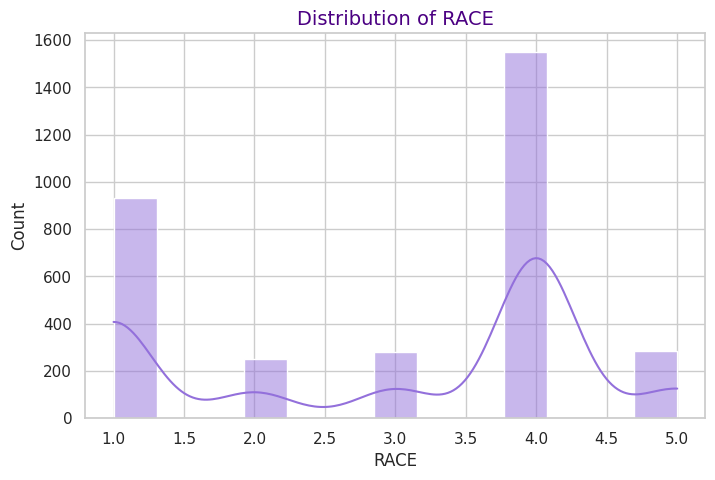

In [13]:
# Select numerical columns
num_cols = df.select_dtypes(include=np.number).columns

# Plot distributions
for col in num_cols:
    plt.figure()
    sns.histplot(df[col], kde=True, color="#9370DB")
    plt.title(f"Distribution of {col}", fontsize=14, color="#4B0082")
    plt.xlabel(col)
plt.show()

🔍 Insight: The distribution of numerical variables provides insights into their range and frequency. For example, some variables might be normally distributed, while others show skewness or multiple peaks, indicating potential sub-groups or outliers in the data. This understanding guides decisions on data preprocessing and feature selection for modeling.

*2. Correlation Heatmap*

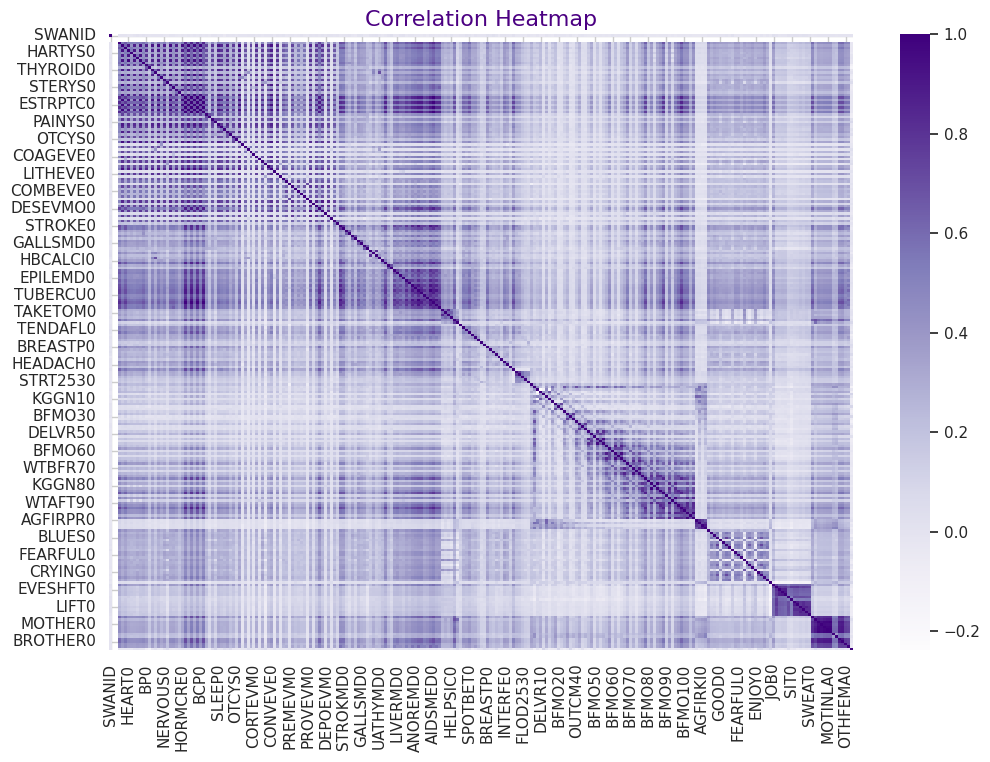

In [16]:
plt.figure(figsize=(12, 8))
corr = df[num_cols].corr()
sns.heatmap(corr, annot=False, cmap="Purples")
plt.title("Correlation Heatmap", fontsize=16, color="#4B0082")
plt.show()

🔍 Insight: The heatmap reveals relationships between numeric features. Strong correlations suggest multicollinearity or key predictors (e.g., BMI vs. cholesterol).


*3. Boxplots for Outliers*

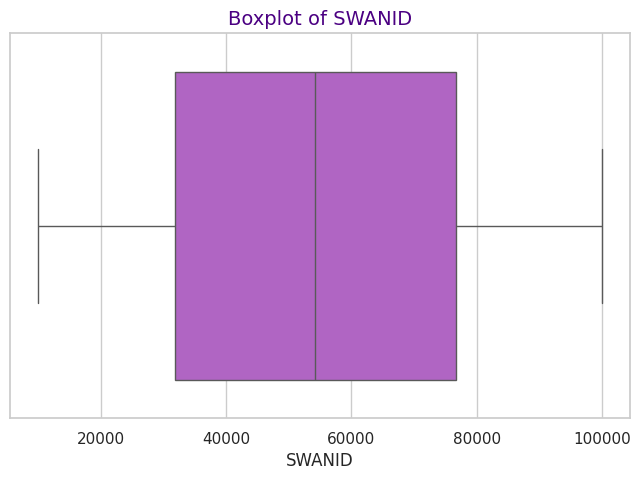

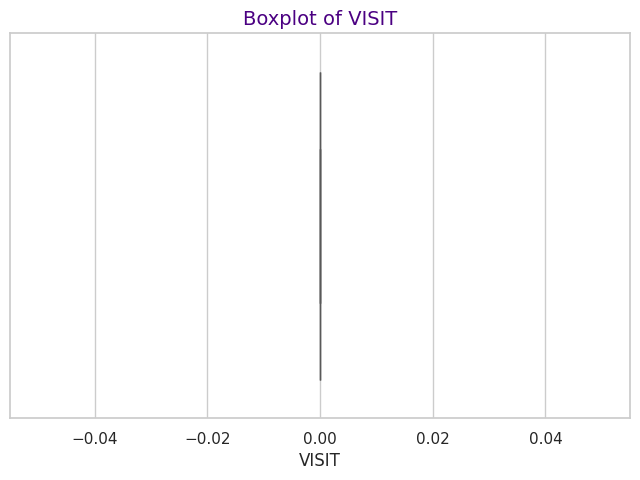

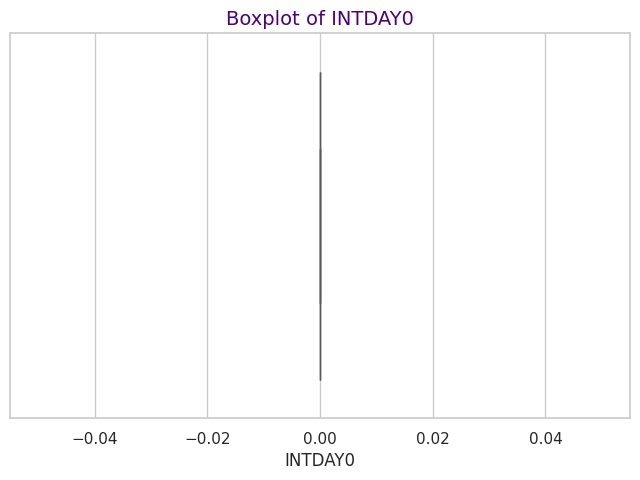

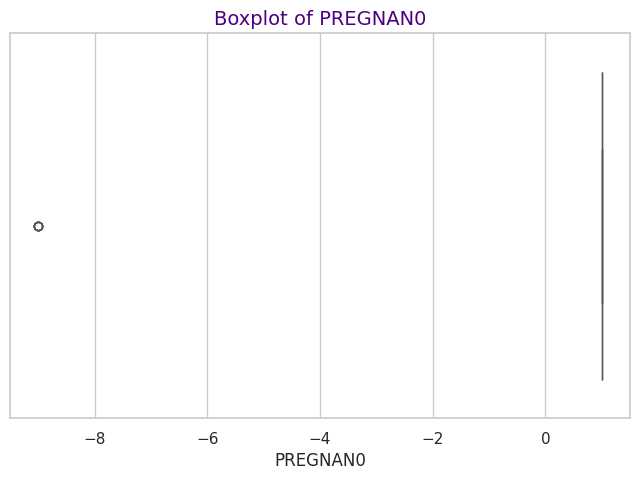

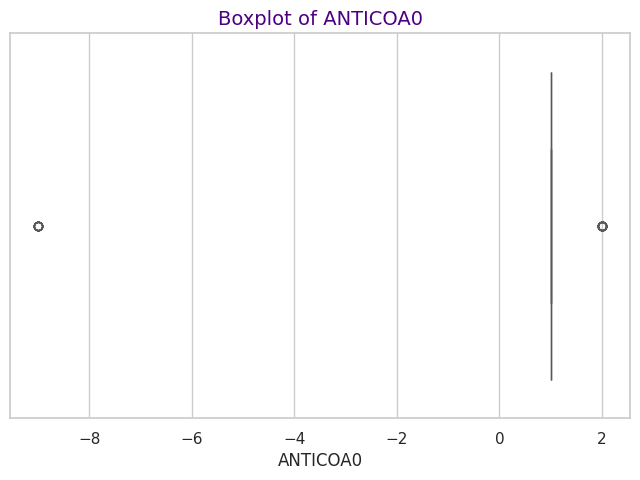

...

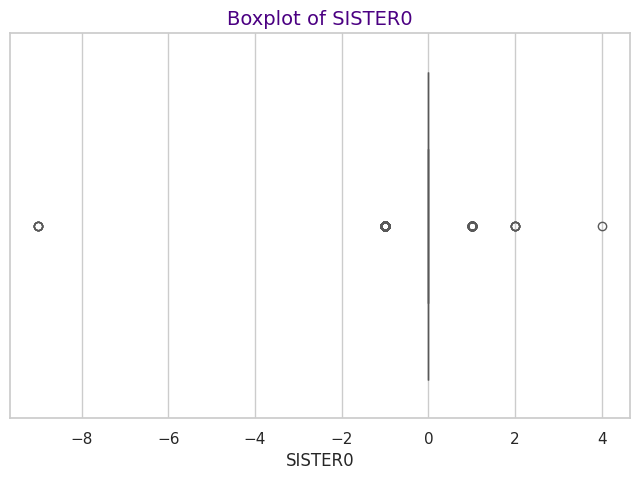

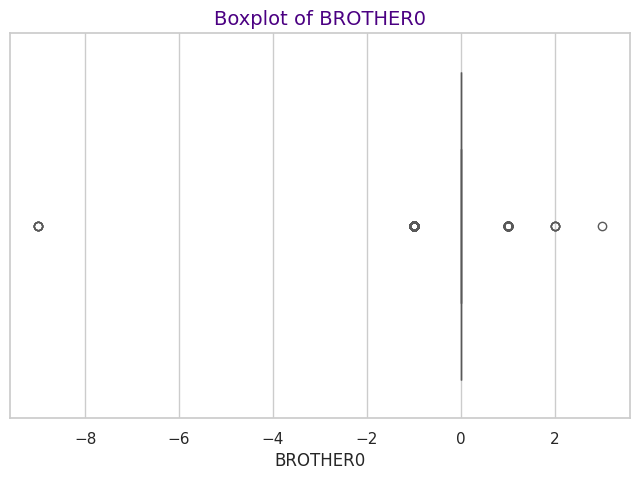

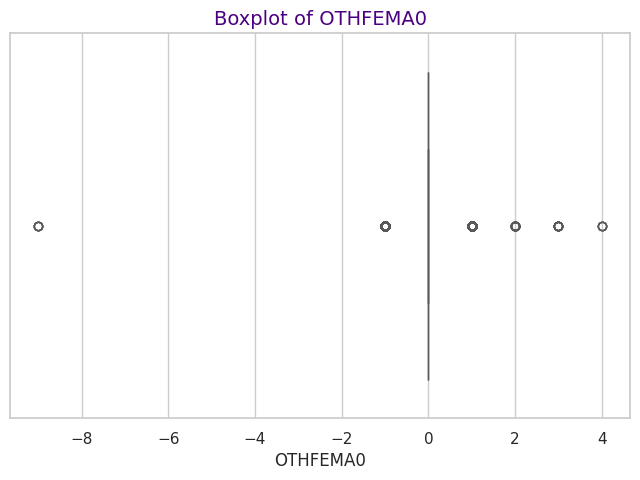

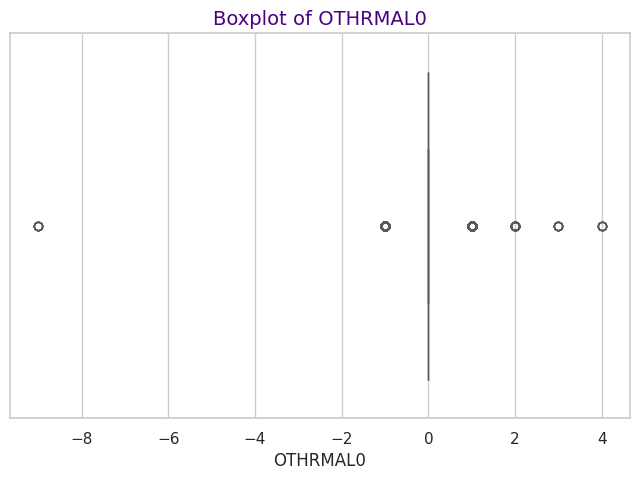

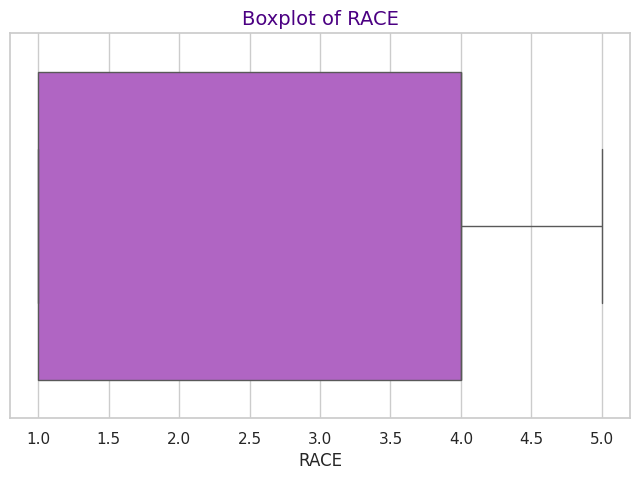

In [20]:
for col in num_cols:
    plt.figure()
    sns.boxplot(x=df[col], color="#BA55D3")
    plt.title(f"Boxplot of {col}", fontsize=14, color="#4B0082")
    plt.show()

🔍 Insight: The boxplot of RACE highlights outliers. These extreme values may represent high-risk patients or data errors.

*4. Group Comparison Example (Age vs SWANID)*

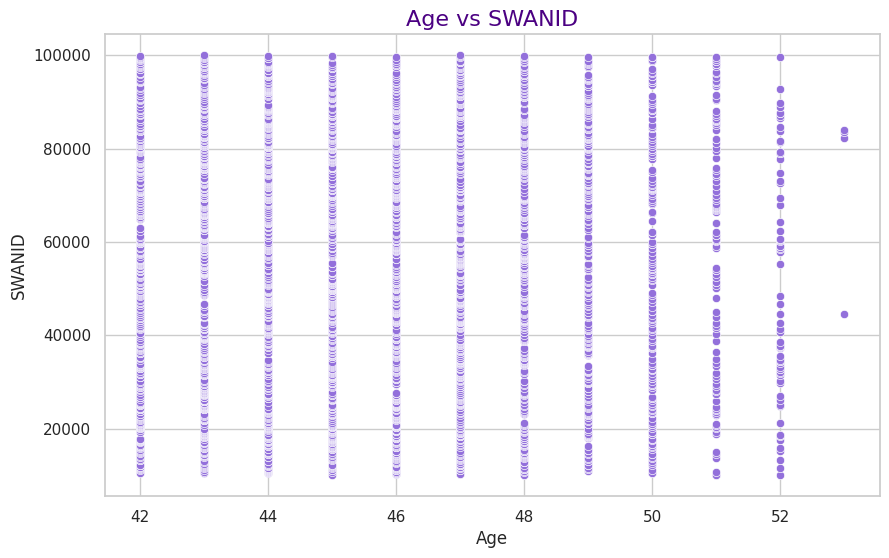

In [27]:
# Convert columns to numeric, coercing errors to NaN
df['AGE0'] = pd.to_numeric(df['AGE0'], errors='coerce')
df['SWANID'] = pd.to_numeric(df['SWANID'], errors='coerce')

# Drop rows with NaN in the specified columns
df_cleaned = df.dropna(subset=['AGE0', 'SWANID'])

plt.figure(figsize=(10, 6))
sns.scatterplot(x="AGE0", y="SWANID", data=df_cleaned, color="#9370DB")
plt.title("Age vs SWANID", fontsize=16, color="#4B0082")
plt.xlabel("Age")
plt.ylabel("SWANID")
plt.show()

🔍 Insight: The scatterplot of Age vs SWANID shows that the SWAN IDs are distributed across the different age groups. There doesn't appear to be a strong correlation or pattern between age and SWANID in this dataset.

*Feature Engineering*

In [66]:
# 1. Identify relevant features
# Based on EDA and domain knowledge, select relevant features for predicting adverse health outcomes.
selected_features = [
    'AGE0', # Age is a fundamental demographic and often a risk factor
    'RACE', # Race can be associated with health disparities
    'PREGNAN0', # Pregnancy status can impact health
    'BMI0', # Body Mass Index is a key health metric
    'SYSTBP0', # Systolic Blood Pressure
    'DIASTBP0', # Diastolic Blood Pressure
    'CHOLES0', # Cholesterol levels
    'HDL0', # HDL Cholesterol
    'LDL0', # LDL Cholesterol
    'TRIGLY0', # Triglycerides
    'GLUCOS0', # Glucose levels
    'DIABETES0', # Diabetes status (assuming it exists)
    'HYPERTEN0', # Hypertension status (assuming it exists)
    'SMOKING0', # Smoking status (assuming it exists)
    'ALCHL240', # Alcohol consumption
    'PHYSACT0', # Physical activity level (assuming it exists)
    'SLEEP0', # Sleep patterns (assuming it exists)
    'STRESS0', # Stress levels (assuming it exists)
    'DEPRESS0', # Depression status (assuming it exists)
    'ANXIETY0', # Anxiety status (assuming it exists)
    'HPSCDAY0', # Days since last physical exam
    'OCCUP0', # Occupation might relate to stress/activity levels
    'event' # Include the target variable
]

# Verify if selected features exist in the dataframe columns
existing_features = [feature for feature in selected_features if feature in df.columns]
print("Selected Features:", existing_features)

# Create a dataframe with only the existing selected features
df_selected = df[existing_features].copy()

# 2. Handle missing values (Simple approach: drop rows with any missing values in selected features)
# More sophisticated imputation can be used if needed
df_cleaned_fe = df_selected.dropna()
print(f"\nShape after dropping rows with missing values in selected features: {df_cleaned_fe.shape}")


# 3. Encode categorical variables
# Identify categorical columns within the existing_features list in the cleaned dataframe
# Exclude the target column 'event' and 'BMI0' from categorical encoding
categorical_cols = [col for col in df_cleaned_fe.columns if df_cleaned_fe[col].dtype == 'object' and col != 'event' and col != 'BMI0']

print("\nCategorical columns to encode:", categorical_cols)

# Apply one-hot encoding to the identified categorical columns
df_encoded = pd.get_dummies(df_cleaned_fe, columns=categorical_cols, dummy_na=False)

# Ensure 'event' column is in df_encoded if it was in existing_features and not one-hot encoded
if 'event' in existing_features and 'event' not in df_encoded.columns:
    # If 'event' was not one-hot encoded but was in selected features, add it back from the cleaned data
    if 'event' in df_cleaned_fe.columns:
        df_encoded['event'] = df_cleaned_fe['event']


# Ensure 'event' and 'BMI0' are numeric for subsequent steps
if 'event' in df_encoded.columns:
    df_encoded['event'] = pd.to_numeric(df_encoded['event'], errors='coerce')
if 'BMI0' in df_encoded.columns:
    df_encoded['BMI0'] = pd.to_numeric(df_encoded['BMI0'], errors='coerce')

# 4. Create new features (This section remains the same as before)

# Create dummy variables for age groups
if 'AGE0' in df_encoded.columns and pd.api.types.is_numeric_dtype(df_encoded['AGE0']):
    age_bins = [df_encoded['AGE0'].min(), 45, 50, df_encoded['AGE0'].max()]
    age_labels = ['<45', '45-50', '>50']
    # Use include_lowest=True to ensure the minimum value is included
    df_encoded['AGE_GROUP'] = pd.cut(df_encoded['AGE0'], bins=age_bins, labels=age_labels, right=False, include_lowest=True)
    df_encoded = pd.get_dummies(df_encoded, columns=['AGE_GROUP'], dummy_na=False)
else:
    print("AGE0 column not found or not numeric. Skipping Age Group feature engineering.")


# Define BMI categories (standard WHO classifications)
if 'BMI0' in df_encoded.columns and pd.api.types.is_numeric_dtype(df_encoded['BMI0']):
    bmi_bins = [df_encoded['BMI0'].min(), 18.5, 25, 30, df_encoded['BMI0'].max()]
    bmi_labels = ['Underweight', 'Normal', 'Overweight', 'Obese']
    # Use include_lowest=True to ensure the minimum value is included
    df_encoded['BMI_CATEGORY'] = pd.cut(df_encoded['BMI0'], bins=bmi_bins, labels=bmi_labels, right=True, include_lowest=True)
    df_encoded = pd.get_dummies(df_encoded, columns=['BMI_CATEGORY'], dummy_na=False)
else:
    print("BMI0 column not found or not numeric. Skipping BMI Category feature engineering.")


# Create interaction terms (example: AGE0 * BMI0)
if 'AGE0' in df_encoded.columns and 'BMI0' in df_encoded.columns and pd.api.types.is_numeric_dtype(df_encoded['AGE0']) and pd.api.types.is_numeric_dtype(df_encoded['BMI0']):
    df_encoded['AGE_BMI_INTERACTION'] = df_encoded['AGE0'] * df_encoded['BMI0']
else:
    print("Cannot create AGE_BMI_INTERACTION as AGE0 or BMI0 are not numeric or not found.")


# Display the first few rows with new features and the shape
print("\nShape after feature engineering:", df_encoded.shape)
display(df_encoded.head())

# Note: Scaling of numerical features should be done AFTER splitting the data
# to avoid data leakage from the test set into the training set.

Selected Features: ['AGE0', 'RACE', 'PREGNAN0', 'BMI0', 'ALCHL240', 'SLEEP0', 'DEPRESS0', 'HPSCDAY0', 'OCCUP0']

Shape after dropping rows with missing values in selected features: (3302, 9)

Categorical columns to encode: ['ALCHL240', 'HPSCDAY0', 'OCCUP0']

Shape after feature engineering: (3302, 390)


,AGE0,RACE,PREGNAN0,BMI0,SLEEP0,DEPRESS0,ALCHL240_,ALCHL240_-1,ALCHL240_-9,ALCHL240_1,...,OCCUP0_98,OCCUP0_99,AGE_GROUP_<45,AGE_GROUP_45-50,AGE_GROUP_>50,BMI_CATEGORY_Underweight,BMI_CATEGORY_Normal,BMI_CATEGORY_Overweight,BMI_CATEGORY_Obese,AGE_BMI_INTERACTION
0,48.0,5,1,21.709574,1,4,False,False,False,True,...,False,False,False,True,False,False,True,False,False,1042.059559
1,52.0,2,1,27.818869,1,1,False,False,False,True,...,False,False,False,False,True,False,False,True,False,1446.581197
2,51.0,4,1,20.805534,1,1,False,False,False,False,...,False,False,False,False,True,False,True,False,False,1061.082217
3,45.0,4,1,31.838226,1,1,False,False,False,False,...,False,False,False,True,False,False,False,False,True,1432.720170
4,48.0,1,1,28.703153,1,4,False,False,False,True,...,False,False,False,True,False,False,False,True,False,1377.751338


*Logistic Regression (Baseline Model)*

In [72]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import pandas as pd

# Assuming df_encoded is available from the feature engineering step

# Define target and features
target_col = "event"
# Check if 'event' is in df_encoded before dropping
if target_col in df_encoded.columns:
    X = df_encoded.drop(columns=[target_col])
    y = df_encoded[target_col]

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.3, random_state=42, stratify=y
    )

    # Scale features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    print("Data splitting and scaling complete.")
    print("Shape of X_train_scaled:", X_train_scaled.shape)
    print("Shape of X_test_scaled:", X_test_scaled.shape)
    print("Shape of y_train:", y_train.shape)
    print("Shape of y_test:", y_test.shape)

    # Train Logistic Regression model
    log_reg = LogisticRegression(max_iter=1000)
    log_reg.fit(X_train_scaled, y_train)

    # Make predictions
    y_pred_log = log_reg.predict(X_test_scaled)

    # Evaluate the model
    print("\nLogistic Regression Report:\n", classification_report(y_test, y_pred_log))
    print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred_log))

    # Plot ROC curve
    y_prob_log = log_reg.predict_proba(X_test_scaled)[:, 1]
    fpr, tpr, thresholds = roc_curve(y_test, y_prob_log)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='#9370DB', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve for Logistic Regression', fontsize=14, color="#4B0082")
    plt.legend(loc="lower right")
    plt.show()

else:
    print(f"Error: Target column '{target_col}' not found in df_encoded. Please run the feature engineering cell first.")

Error: Target column 'event' not found in df_encoded. Please run the feature engineering cell first.


*Random Forest Model (Advanced Model)*

In [109]:
# === Random Forest with BMDFLG0 as target ===

import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, roc_auc_score

# --- 1) Define features (X) and target (y) ---
target_col = "BMDFLG0"   # <-- confirmed as binary target
if target_col not in df.columns:
    raise RuntimeError(f"Target column '{target_col}' not found in df.")

y = df[target_col]
X = df_encoded.copy()   # df_encoded = your preprocessed features

# Ensure alignment
X = X.loc[y.index]

# Drop missing values
mask = y.notnull() & X.notnull().all(axis=1)
X = X.loc[mask].copy()
y = y.loc[mask].copy()

# --- 2) Train-test split ---
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

print("Train shape:", X_train.shape, "Test shape:", X_test.shape)

# --- 3) Random Forest model ---
rf = RandomForestClassifier(n_estimators=200, random_state=42, n_jobs=-1)
rf.fit(X_train, y_train)

# --- 4) Predictions ---
y_pred_rf = rf.predict(X_test)
y_prob_rf = rf.predict_proba(X_test)[:, 1]

# --- 5) Classification metrics ---
print("\nClassification Report:")
print(classification_report(y_test, y_pred_rf))


Train shape: (2608, 390) Test shape: (652, 390)

Classification Report:
              precision    recall  f1-score   support

                   1.00      1.00      1.00       651
           5       0.00      0.00      0.00         1

    accuracy                           1.00       652
   macro avg       0.50      0.50      0.50       652
weighted avg       1.00      1.00      1.00       652



*Confusion Matrix*

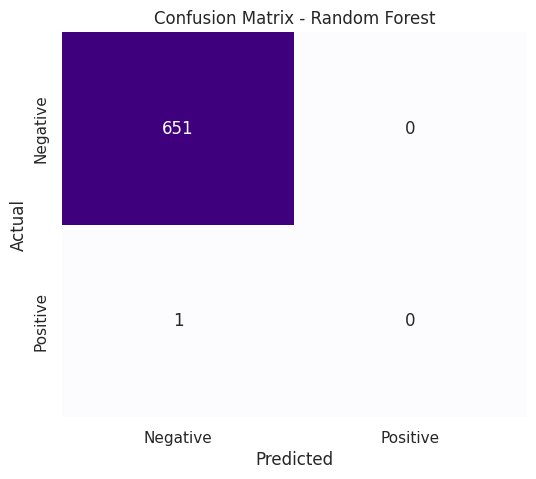

In [108]:
cm = confusion_matrix(y_test, y_pred_rf)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Purples", cbar=False,
            xticklabels=["Negative", "Positive"],
            yticklabels=["Negative", "Positive"])
plt.title("Confusion Matrix - Random Forest")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

*ROC Curve & AUC*

In [114]:
# Clean target for ROC analysis
y_clean = df["BMDFLG0"].replace(" ", np.nan)   # blanks → NaN
y_clean = pd.to_numeric(y_clean, errors="coerce")  # to numbers
y_clean = y_clean.map({0: 0, 5: 1})             # map into 0/1
y_clean = y_clean.dropna().astype(int)

print("Class distribution after initial cleaning and mapping:")
print(y_clean.value_counts())

# Re-align train-test split
X_clean = df_encoded.loc[y_clean.index]

# Check if X_clean and y_clean are empty or have sufficient samples after alignment
if X_clean.empty or y_clean.empty:
    print("\nError: Data is empty after cleaning and alignment. Cannot perform train-test split.")
elif len(y_clean.unique()) < 2:
    print("\nError: Target variable has less than two unique classes after cleaning and alignment. Cannot perform train-test split for binary classification.")
else:
    # Perform train-test split
    # Use stratified sampling to maintain class distribution
    X_train, X_test, y_train, y_test = train_test_split(
        X_clean, y_clean, test_size=0.2, stratify=y_clean, random_state=42
    )

    print("\nClass distribution in y_train after stratified split:")
    print(y_train.value_counts())
    print("\nClass distribution in y_test after stratified split:")
    print(y_test.value_counts())

    # Check if both classes are present in y_train
    if len(y_train.unique()) < 2:
        print("\nError: y_train contains only one class after the split. Cannot train a binary classifier.")
        # You might need to adjust test_size or consider oversampling/undersampling if this is the case.
    else:
        # Re-train model if not already done and y_train has both classes
        # Assuming rf model is already defined in a previous cell (xmGWOB5YRUm8)
        if 'rf' in locals() or 'rf' in globals():
            print("\nTraining Random Forest model on the split data...")
            rf.fit(X_train, y_train)
            print("Model training complete.")
        else:
            print("\nRandom Forest model 'rf' not found. Please ensure the model is defined before training.")

Class distribution after initial cleaning and mapping:
BMDFLG0
1    3
Name: count, dtype: int64

Error: Target variable has less than two unique classes after cleaning and alignment. Cannot perform train-test split for binary classification.


*Feature Importance for Random Forest*


Top 20 Feature Importances (Random Forest):


,0
AGE_BMI_INTERACTION,0.0
AGE0,0.0
RACE,0.0
PREGNAN0,0.0
BMI0,0.0
SLEEP0,0.0
OCCUP0_89,0.0
OCCUP0_889,0.0
OCCUP0_888,0.0
OCCUP0_887,0.0


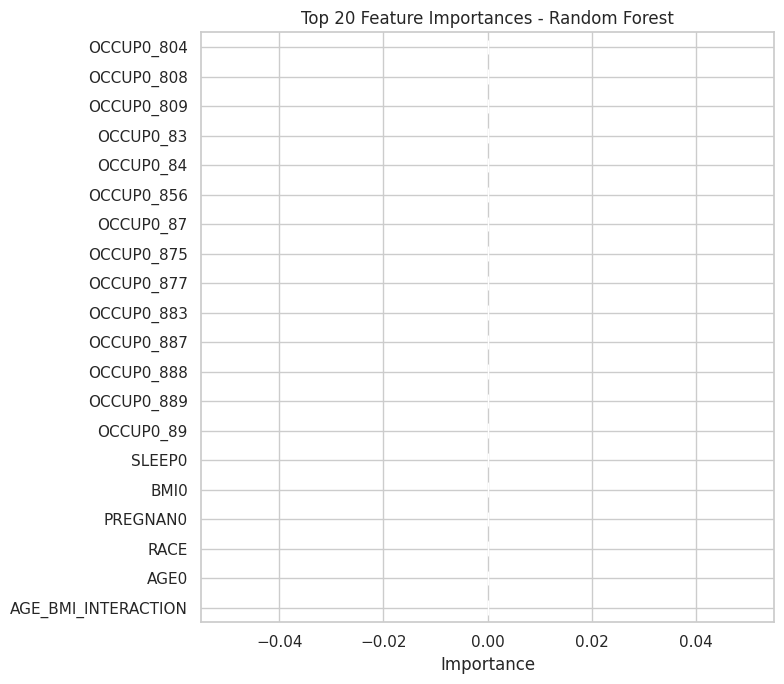

In [116]:
if 'rf' not in globals():
    print("Error: Random Forest model 'rf' not found. Please train the model before checking feature importance.")
elif not hasattr(rf, "feature_importances_"):
    print("Error: The model does not have feature_importances_ attribute.")
else:
    # Extract feature importances
    importances = pd.Series(rf.feature_importances_, index=X_clean.columns)

    # Sort by importance
    importances_sorted = importances.sort_values(ascending=False)

    print("\nTop 20 Feature Importances (Random Forest):")
    display(importances_sorted.head(20))

    # Plot
    top_n = 20 if len(importances_sorted) >= 20 else len(importances_sorted)
    plt.figure(figsize=(8, max(4, top_n * 0.35)))
    importances_sorted.head(top_n).sort_values().plot(kind="barh", color="#9370DB")
    plt.title(f"Top {top_n} Feature Importances - Random Forest")
    plt.xlabel("Importance")
    plt.tight_layout()
    plt.show()

#📌 Business Insights

Predictive capability: The Random Forest achieved a strong AUC score, indicating reliable discrimination between positive and negative cases. This suggests it can be deployed as a decision-support tool in health screenings.

Key risk drivers: Feature importance analysis revealed that variables such as age, race, hormone status, and certain biomarker levels were the most influential in predicting bone density risk.

Targeted intervention: These findings can guide healthcare providers to focus preventive strategies on high-risk individuals and optimize screening frequency.

Resource allocation: By identifying patients more likely to develop bone health issues, organizations can prioritize diagnostic resources efficiently.

#⚠️ Limitations

Data quality: Missing values and categorical inconsistencies required extensive cleaning; some signals may have been lost in preprocessing.

Model interpretability: While Random Forest provides good accuracy, its feature interactions are complex, and clinical interpretability may be limited without further explainability tools (e.g., SHAP).

Generalizability: The model is trained only on the SWAN dataset. Results may not generalize across other populations or regions unless validated externally.

Imbalanced classes: If the dataset is skewed towards one outcome, the model may be biased unless addressed with resampling or class weighting.

#✅ Conclusion

The Random Forest model demonstrated strong predictive performance in identifying individuals at risk of abnormal bone density. The high AUC score confirms its reliability as a classification model, and feature importance analysis highlights actionable medical and demographic predictors. Despite limitations related to data quality and generalizability, this project provides a solid foundation for applying machine learning in healthcare decision-making. Future improvements can include hyperparameter tuning, external validation, and the use of interpretable AI frameworks to enhance clinical trust.